# Markov-1

In 2D flow assuming isotropic RMS velocity ($\nu$), the Markov-1 model can be formulated as follows:
$$
dx_i = [U_i(\mathbf{x}) + u'_i]dt \\
du'_i = -\frac{1}{T_L} u'_i dt + \sqrt{\frac{2}{T_L}}\nu dW_i
$$

This is easily integrated in time. Note that in the limit $t>>T_l$, the dispersion can be approximated as diffusive $\kappa = \nu^2 T_l$.

In 3D, without assuming isotropy, the Markov-1 parameterization becomes more involved:
$$
dx_i = [U_i(\mathbf{x}) + u'_i]dt \\
du'_i = [-\theta^{-1}(\mathbf{x})_{ij}u'_j + \tilde{a}_i(\mathbf{x, u'})] dt + b_{ij}(\mathbf{x}) dW_j(t)
$$

Here, $\theta$ is fading-memory time tensor, and $\tilde{a}_i$ is a drift correction term for asserting the well-mixed condition (similar to 'kicking particles out of low diffusivity areas' in the diffusive model). It's given by 

$$
\tilde{a}_i = \frac{1}{2} \frac{\partial \sigma_{ik}}{\partial x_k} - \frac{\sigma_{im}}{2}(U_k+u'_k)\frac{\partial(\sigma^{-1})_{jm}}{\partial x_k} u'j - \frac{\sigma_{im}}{2} \frac{\partial(\sigma^{-1})_{mj}}{\partial x_k} u'_j u'_k
$$

The stochastic increment is related to $\sigma$, the velocity RMS tensor, as 
$$ b_{ij}b_{jk} = 2\sigma_{ij}(\theta^{-1})_{jk}$$.

In isopycnal coordinates, we can assume that $\sigma$ and $\theta$ are isotropic in the isopycnal plane, with values on the diagonal of $\nu^2$ and $T_l$ respectively, except for on the $i=z, j=z$ elements. These tensors can be rotated into geodesic coordinates in a similar way as described by Redi (1982), except $\nu^2$ and $T_l$ take the place of $A_H$ (in Redi's notation).

This yields a problem: the resulting rotated tensors are singular, implying their inverse does not exist.

We look into some numerical implementations....

In [21]:
import math
import random
import numpy as np

from datetime import timedelta

import matplotlib
import matplotlib.pyplot as plt
import sys
import xarray as xr

import plotly
import plotly.graph_objects as go

import parcels

from parcels import (
    AdvectionDiffusionEM,
    AdvectionRK4_3D,
    AdvectionDiffusionM1,
    DiffusionUniformKh,
    FieldSet,
    JITParticle,
    ScipyParticle,
    ParticleSet,
    Variable,
    ParcelsRandom,
)
import importlib
import pickle
import pandas as pd
from scipy.integrate import dblquad

In [22]:
sys.path.append("/Users/4302001/surfdrive/diffusion-hydro-mod/kernels")
sys.path.append("/nethome/4302001/diffusion-hydro-mod/kernels")
import idealized_isopycnal_field
import elements_analytical
import K_Le_Sommer
import K_Redi
import K_Redi_smallslope
import EM_3D_BC
import M1_3D_BC
import idealized_isopycnal_field
import Markov1_3D_BC_taper
import Markov1_3D_BC_taper_init
importlib.reload(idealized_isopycnal_field)

<module 'idealized_isopycnal_field' from '/science-nfs-sys/vsm01/users/4302001/diffusion-hydro-mod/idealized_experiments/idealized_isopycnal_field.py'>

In [23]:
# outdir = "~/surfdrive/diffusion-hydro-mod/trajectory_output/"
outdir = "/scratch/daanr/trajectory_output/idealized/"

Here we set up an idealized density field, similar to the one in Shah et al (2011) and Van Sebille et al. (2018).

# Set-up

In [24]:
def create_fieldset(
    rhoField,
    dsamp_x=None,
    dsamp_y=None,
    dsamp_z=None,
    K_method=None,
    expansion_terms=None,
    interp_method="linear",
    Ki=1000,
    Tl=1 * 24 * 60 * 60,
    nu_squared=None,  # RMS eddy velocity, following Koszalka
    epsilon=None,
    eta=None,
):
    """
    Prepares a fieldset of an idealized isopycnal field. 

    The fieldset can be used for numerically computing trajectories using Markov-1 or Markov-0 (diffusive) parameterizations. 
    Note that in case of Markov-1, `nu_squared` is computed using the assymptotic behavior: Ki = nu_squared * Tl,
    so only `Ki` and `Tl` need to be parameterized. 
    """

    data = {
        "U": np.swapaxes(np.zeros(rhoField.rho_averaged.shape), 0, 2),
        "V": np.swapaxes(np.zeros(rhoField.rho_averaged.shape), 0, 2),
        "W": np.swapaxes(np.zeros(rhoField.rho_averaged.shape), 0, 2),
        "boundaryMask": np.swapaxes(np.ones(rhoField.rho_averaged.shape), 0, 2),
        "Rho": np.swapaxes(rhoField.rho_averaged, 0, 2),
    }
    if K_method == "sampled_K":
        data["K11"] = np.swapaxes(np.ones(rhoField.Sx.shape) * Ki, 0, 2)
        data["K21"] = np.swapaxes(np.zeros(rhoField.Sx.shape), 0, 2)
        data["K22"] = np.swapaxes(np.ones(rhoField.Sx.shape) * Ki, 0, 2)
        data["K31"] = np.swapaxes(rhoField.Sx * Ki, 0, 2)
        data["K32"] = np.swapaxes(rhoField.Sy * Ki, 0, 2)
        data["K33"] = np.swapaxes(rhoField.Sabs2 * Ki, 0, 2)
    elif K_method in ["sampled_S", "sampled_S_deriv"]:
        data["Sx"] = np.swapaxes(rhoField.Sx, 0, 2)
        data["Sy"] = np.swapaxes(rhoField.Sy, 0, 2)
    if K_method == "sampled_S_deriv":
        data["dSxdx"] = np.swapaxes(rhoField.dSxdx, 0, 2)
        data["dSxdy"] = np.swapaxes(rhoField.dSxdy, 0, 2)
        data["dSxdz"] = np.swapaxes(rhoField.dSxdz, 0, 2)
        data["dSydx"] = np.swapaxes(rhoField.dSydx, 0, 2)
        data["dSydy"] = np.swapaxes(rhoField.dSydy, 0, 2)
        data["dSydz"] = np.swapaxes(rhoField.dSydz, 0, 2)
        dims_normal = {"lon": myField.X, "lat": myField.Y, "depth": myField.Z}
        dims_stagx = {"lon": myField.X_stag[1:-1], "lat": myField.Y, "depth": myField.Z}
        dims_stagy = {"lon": myField.X, "lat": myField.Y_stag[1:-1], "depth": myField.Z}
        dims_stagz = {"lon": myField.X, "lat": myField.Y, "depth": myField.Z_stag[1:-1]}
        dims = {"U": dims_normal,
                "V": dims_normal,
                "W": dims_normal,
                "Rho": dims_normal,
                "Sx": dims_normal,
                "Sy": dims_normal,
                "dSxdx": dims_stagx,
                "dSxdy": dims_stagy,
                "dSxdz": dims_stagz,
                "dSydx": dims_stagx,
                "dSydy": dims_stagy,
                "dSydz": dims_stagz,
                }
    else:
        dims = {"lon": myField.X, "lat": myField.Y, "depth": myField.Z}

    fieldset = parcels.FieldSet.from_data(
        data,
        dims,
        mesh="flat",
        allow_time_extrapolation=True,
        interp_method=interp_method,
    )

    if dsamp_x == None:
        dsamp_x = rhoField.dX
    if dsamp_y == None:
        dsamp_y = rhoField.dY
    if dsamp_z == None:
        dsamp_z = rhoField.dZ

    # For discrete sampling
    fieldset.add_constant("dsamp_x", dsamp_x)
    fieldset.add_constant("dsamp_y", dsamp_y)
    fieldset.add_constant("dsamp_z", dsamp_z)

    # For analytical solution
    fieldset.add_constant("gval", rhoField.g)
    fieldset.add_constant("Nsquaredval", rhoField.Nsquared)
    fieldset.add_constant("alphaxval", rhoField.alphax)
    fieldset.add_constant("alphayval", rhoField.alphay)
    fieldset.add_constant("kappaxval", rhoField.kappax)
    fieldset.add_constant("kappayval", rhoField.kappay)
    fieldset.add_constant("rho0val", rhoField.rho0)

    # For Milstein
    if expansion_terms:
        fieldset.add_constant("expansion_terms", expansion_terms)

    # For Markov-0
    fieldset.add_constant("kappaval", Ki)

    # For Markov-1
    fieldset.add_constant("TL", Tl)  # Lagrangian timescale
    if Ki:
        fieldset.add_constant("nusquared", Ki / Tl)
    else:
        fieldset.add_constant("nusquared", nu_squared)

    if epsilon:
        fieldset.add_constant("epsilon", epsilon)
    else:
        fieldset.add_constant("epsilon", 0)
        
    if eta:
        fieldset.add_constant("etaval", eta)

    return fieldset

In [25]:
class Markov1Particle(parcels.JITParticle):
    u_prime = parcels.Variable('u_prime', initial=0)
    v_prime = parcels.Variable('v_prime', initial=0)
    w_prime = parcels.Variable('w_prime', initial=0)

In [26]:
class Markov1DebugParticle(parcels.JITParticle):
    u_prime = parcels.Variable('u_prime', initial=0)
    v_prime = parcels.Variable('v_prime', initial=0)
    w_prime = parcels.Variable('w_prime', initial=0)
    a_stochx = parcels.Variable('a_stochx', initial=0)
    a_stochy = parcels.Variable('a_stochy', initial=0)
    a_stochz = parcels.Variable('a_stochz', initial=0)
    a1x = parcels.Variable('a1x', initial=0)
    a1y = parcels.Variable('a1y', initial=0)
    a1z = parcels.Variable('a1z', initial=0)
    a2x = parcels.Variable('a2x', initial=0)
    a2y = parcels.Variable('a2y', initial=0)
    a2z = parcels.Variable('a2z', initial=0)

In [7]:
def get_test_particles(
    rhoField, fieldset, rho=1027.5, nx=25, ny=50, xbounds=(250000, 750000), ybounds=(250000, 1750000), pclass=Markov1Particle
):
    XX, YY = np.meshgrid(
        np.linspace(xbounds[0], xbounds[1], nx), np.linspace(ybounds[0], ybounds[1], ny), indexing='ij'
    )
    lons = XX.flatten()
    lats = YY.flatten()
    depth = rhoField.isopycnal_array(lons, lats, rho_iso=rho)
    pset = parcels.ParticleSet.from_list(
        fieldset,
        pclass=pclass,
        lon=lons,
        lat=lats,
        depth=depth,
        time=np.zeros(nx * ny),
        lonlatdepth_dtype=np.float64,
    )

    return pset

In [8]:
def get_test_particles_dense(
    rhoField, fieldset, rho=1027.5, nx=80, ny=160, xbounds=(6250, 1000000-6250), ybounds=(6250, 2000000-6250), pclass=Markov1Particle
):
    x_shift = 1_000_000/nx/2
    y_shift = 1_000_000/ny/2
    
    XX, YY = np.meshgrid(
        np.linspace(x_shift, 1_000_000 - x_shift, nx), np.linspace(y_shift, 2_000_000 - y_shift, ny), indexing='ij'
    )
    lons = XX.flatten()
    lats = YY.flatten()
    depth = rhoField.isopycnal_array(lons, lats, rho_iso=rho)
    pset = parcels.ParticleSet.from_list(
        fieldset,
        pclass=pclass,
        lon=lons,
        lat=lats,
        depth=depth,
        time=np.zeros(nx * ny),
        lonlatdepth_dtype=np.float64,
    )

    return pset

In [9]:
def rms_z_error(x, y, z, rho=1027.5):
    true = myField.isopycnal_array(x, y, rho)
    rms_error = np.sqrt(np.mean((z - true)**2))
    return rms_error

In [10]:
def diapycnal_flux(t, RMS_departure, mode="hours"):
    """Determines the diapycnal flux over time"""

    if mode == "hours":
        multip = 60 * 60
    else:
        multip = 1
    return 0.5 * RMS_departure**2 / (multip * t)

In [11]:
def plotTestParticles(testParticles):
    fig = go.Figure(data=[go.Surface(x=XX, y=YY, z=ZZ_iso1027, opacity=0.4),
                          go.Scatter3d(x=testParticles.lon, y=testParticles.lat, z=testParticles.depth,
                                       mode='markers', marker=dict(size=1, color='blue'), opacity=0.8)])
    fig.update_layout(
        title="Isopycnal",
        autosize=False,
        width=1200,
        height=600,
        margin=dict(l=65, r=50, b=65, t=90),
        scene=dict(
            aspectratio=dict(x=1, y=2, z=0.5),
            xaxis=dict(title="x [km]"),
            yaxis=dict(title="y [km]"),
            zaxis=dict(title="z [m]", nticks=3),
        ),
    )

    fig.show()

## Kernels

In [13]:
def deleteParticle(particle, fieldset, time):
    particle.delete()

In [14]:
def periodic_BC(particle, fieldset, time):
    if particle.lon > 1000000:
        particle.lon -= 1000000
    elif particle.lon < 0:
        particle.lon += 1000000
    if particle.lat > 2000000:
        particle.lat -= 2000000
    elif particle.lat < 0:
        particle.lat += 2000000

## Create fields

In [15]:
myField = idealized_isopycnal_field.densityField()
myField.create_interpolated_density_grid(nx=201, ny=401, nz=901, H=6000)
myField.compute_slope()
myField.compute_slope_deriv()

In [16]:
ZZ_iso1027, XX, YY = myField.isopycnal_grid(1027.5, myField.X, myField.Y)

In [17]:
fieldset = create_fieldset(myField, Ki=1000)
testParticles = get_test_particles(myField, fieldset, rho=1027.5)

## Plot initial field

In [12]:
testParticles = get_test_particles_dense(myField, fieldset, rho=1027.5)
fig = go.Figure(data=[go.Surface(x=XX, y=YY, z=ZZ_iso1027, opacity=0.4, showscale=False),
                      go.Scatter3d(x=testParticles.lon, y=testParticles.lat, z=testParticles.depth,
                                   mode='markers', marker=dict(size=0.5, color='blue'), opacity=0.7)])
fig.update_layout(
    #title="Isopycnal",
    autosize=False,
    width=800,
    height=500,
    margin=dict(l=20, r=20, b=20, t=20),
    scene=dict(
        aspectratio=dict(x=1, y=2, z=0.5),
        xaxis=dict(title="x [m]"),
        yaxis=dict(title="y [m]"),
        zaxis=dict(title="z [m]", nticks=3),
    ),
    scene_camera = dict(
        eye=dict(x=1.25*1.8, y=-0.5*1.8, z=0.75*1.8)
    )
)
fig.write_image("viz/particles_EM_90days_k1000_dt40mins.png", width=800, height=500, scale=3)

NameError: name 'myField' is not defined

## Analytical Diffusion Kernel
For reference, we first check the behavior of the analytical diffusion Kernel. As a fair reference test, we use the Euler-Maruyama kernel.

In [32]:
fieldset = create_fieldset(myField, K_method=None, expansion_terms=8, interp_method='linear', epsilon=0)
fieldset.add_constant("Sc", 1)
fieldset.add_constant("Sd", 0.001)
fieldset.add_constant("upperBound", 1e5)
fieldset.add_constant("lowerBound", -1e5)
fieldset.add_constant("northBound", 1e7)
fieldset.add_constant("southBound", -1e7)
testParticles = get_test_particles(myField, fieldset, rho=1027.5)
testParticles.execute(
            testParticles.Kernel(elements_analytical.elements_analytical) 
            + testParticles.Kernel(K_Redi.K_Redi) 
            + testParticles.Kernel(EM_3D_BC.EM_3D_BC)
            + periodic_BC,
            runtime=timedelta(hours=90),
            dt=timedelta(minutes=40),
            verbose_progress=True,
         #   output_file=output_file
)
#output_file.close()
rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth) #slope

INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BCperiodic_BC ==> /tmp/parcels-23300/50bd2a8e7b28420ddb82c61d398d4935_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:03 Time:  0:00:03


1.7011567174332392

In [18]:
fieldset = create_fieldset(myField, Ki=1000, epsilon=1e-8)
fieldset.add_constant("upperBound", 1e5)
fieldset.add_constant("lowerBound", -1e5)
fieldset.add_constant("northBound", 1e7)
fieldset.add_constant("southBound", -1e7)
testParticles = get_test_particles_dense(myField, fieldset)
testParticles.execute(
            testParticles.Kernel(elements_analytical.elements_analytical) 
            + testParticles.Kernel(K_Redi.K_Redi) 
            + testParticles.Kernel(EM_3D_BC.EM_3D_BC)
            + periodic_BC,
            runtime=timedelta(hours=7 * 24),
            dt=timedelta(minutes=40),
            verbose_progress=True,
    #   output_file=output_file
)
# output_file.close()
rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth)  # slope

INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BCperiodic_BC ==> /tmp/parcels-23300/40538f54423843c55490706d2c8e98a6_0.so
100% (604800.0 of 604800.0) |############| Elapsed Time: 0:00:06 Time:  0:00:06


4.2782693054798155

In [19]:
fieldset = create_fieldset(myField, Ki=1000)
fieldset.add_constant("upperBound", 1e5)
fieldset.add_constant("lowerBound", -1e5)
fieldset.add_constant("northBound", 1e7)
fieldset.add_constant("southBound", -1e7)
testParticles = get_test_particles_dense(myField, fieldset)
testParticles.execute(
    testParticles.Kernel(elements_analytical.elements_analytical) 
        + K_Redi.K_Redi
        + EM_3D_BC.EM_3D_BC
        + periodic_BC,
    runtime=timedelta(hours=90 * 24),
    dt=timedelta(minutes=40),
    verbose_progress=True,
    #   output_file=output_file
    recovery={parcels.ErrorCode.ErrorOutOfBounds: deleteParticle}
)
# output_file.close()
rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth)  # slope

INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BCperiodic_BC ==> /tmp/parcels-23300/5522416a7647125c7d0b21bc35f3c97c_0.so
100% (7776000.0 of 7776000.0) |##########| Elapsed Time: 0:00:42 Time:  0:00:42


4.834531666543059

#### Full Redi + M1

In [37]:
fieldset = create_fieldset(myField, Ki=1000, epsilon=1e-13)
fieldset.add_constant("upperBound", 1e5)
fieldset.add_constant("lowerBound", -1e5)
fieldset.add_constant("northBound", 1e7)
fieldset.add_constant("southBound", -1e7)
fieldset.add_constant("Sc", 1)
fieldset.add_constant("Sd", 0.001)
fieldset.add_constant("expansion_terms", 6)
testParticles = get_test_particles_dense(myField, fieldset)
testParticles.execute(
    testParticles.Kernel(elements_analytical.elements_analytical) 
        + K_Redi.K_Redi
        + M1_3D_BC.M1_3D_BC
        + periodic_BC,
    runtime=timedelta(hours=90 * 24),
    dt=timedelta(minutes=40),
    verbose_progress=True,
    #   output_file=output_file
    recovery={parcels.ErrorCode.ErrorOutOfBounds: deleteParticle}
)
# output_file.close()
rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth)  # slope

INFO: Compiled Markov1Particleelements_analyticalK_RediM1_3D_BCperiodic_BC ==> /tmp/parcels-23300/f8fe0b37cdd58d8a6f4092dfff09b14b_0.so
100% (7776000.0 of 7776000.0) |##########| Elapsed Time: 0:02:53 Time:  0:02:53


4.7099891213530976

In [36]:
diapycnal_flux(90*24, 4.7)

1.4203960905349796e-06

#### Markov-0 smallslope

In [103]:
fieldset = create_fieldset(myField, Ki=1000)
fieldset.add_constant("upperBound", 1e5)
fieldset.add_constant("lowerBound", -1e5)
fieldset.add_constant("northBound", 1e7)
fieldset.add_constant("southBound", -1e7)
fieldset.add_constant("Sc", 1)
fieldset.add_constant("Sd", 0.001)
testParticles = get_test_particles_dense(myField, fieldset)
testParticles.execute(
    testParticles.Kernel(elements_analytical.elements_analytical) 
        + testParticles.Kernel(K_Redi_smallslope.K_Redi_smallslope) 
        + testParticles.Kernel(EM_3D_BC.EM_3D_BC)
        + periodic_BC,
    runtime=timedelta(hours=90 * 24),
    dt=timedelta(minutes=40),
    verbose_progress=True,
    #   output_file=output_file
    recovery={parcels.ErrorCode.ErrorOutOfBounds: deleteParticle}
)
# output_file.close()
rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth)  # slope

INFO: Compiled Markov1Particleelements_analyticalK_Redi_smallslopeEM_3D_BCperiodic_BC ==> /tmp/parcels-23300/ce2006b5422f63daabb8123282767ca8_0.so
100% (7776000.0 of 7776000.0) |##########| Elapsed Time: 0:00:36 Time:  0:00:36


4.849113027294896

In [104]:
fig = go.Figure(data=[go.Surface(x=XX, y=YY, z=ZZ_iso1027, opacity=0.4, showscale=False),
                      go.Scatter3d(x=testParticles.lon, y=testParticles.lat, z=testParticles.depth,
                                   mode='markers', marker=dict(size=0.5, color='blue'), opacity=0.7)])
fig.update_layout(
    #title="Isopycnal",
    autosize=False,
    width=800,
    height=500,
    margin=dict(l=20, r=20, b=20, t=20),
    scene=dict(
        aspectratio=dict(x=1, y=2, z=0.5),
        xaxis=dict(title="x [m]"),
        yaxis=dict(title="y [m]"),
        zaxis=dict(title="z [m]", nticks=3),
    ),
    scene_camera = dict(
        eye=dict(x=1.25*1.8, y=-0.5*1.8, z=0.75*1.8)
    )
)
fig.write_image("viz/particles_EM_90days_k1000_dt40mins.png", width=800, height=500, scale=3)

In [105]:
def EM_error(dt_mins, Ki, powers=11, returnWhat='diaflux'):
    runHours = np.ones(powers) * 2**np.arange(powers)
    error = np.zeros(powers)
    fieldset = create_fieldset(myField, Ki=Ki)
    fieldset.add_constant("upperBound", 1e5)
    fieldset.add_constant("lowerBound", -1e5)
    fieldset.add_constant("northBound", 1e7)
    fieldset.add_constant("southBound", -1e7)
    fieldset.add_constant("max_dt", 40*60)
    fieldset.add_constant("min_dt", 20*60)
    for i, hours in enumerate(runHours):
        testParticles = get_test_particlesperiodic_BC_dense(myField, fieldset, rho=1027.5)
        testParticles.execute(
            testParticles.Kernel(elements_analytical.elements_analytical) 
            + testParticles.Kernel(K_Redi_smallslope.K_Redi_smallslope) 
            + testParticles.Kernel(EM_3D_BC.EM_3D_BC)
            + periodic_BC,
            runtime=timedelta(hours=hours),
            dt=timedelta(minutes=dt_mins),
            verbose_progress=True,
            recovery={parcels.ErrorCode.ErrorInterpolation: deleteParticle,
                      parcels.ErrorCode.ErrorOutOfBounds: deleteParticle}
        )
        error[i] = rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth)  # slope
    for i in range(2):
        fig, ax = plt.subplots(figsize=(8, 5))
        if i == 0:
            ax.loglog(runHours, error, '-x')
        else:
            ax.plot(runHours, error, '-x')
        ax.set_xlabel('Simulation time [hours]')
        ax.set_ylabel('RMS isopycnal departure [meter]')
        ax.set_title(fr"Markov-0 (EM), Ki = {Ki} $m^2/s$, dt = {dt_mins} mins")
        plt.show()
    if returnWhat == 'diaflux':
        fig, ax = plt.subplots(figsize=(8, 5))
        ax.loglog(runHours, diapycnal_flux(runHours, error, mode="hours"), '-x')
        ax.set_ylabel(r"Effective diapycnal diffusivity [$m^2/s$]")
        ax.set_xlabel('Simulation time [hours]')
        ax.set_title(fr"Markov-0 (EM), Ki = {Ki} $m^2/s$, dt = {dt_mins} mins")
        return diapycnal_flux(runHours, error, mode="hours")
    elif returnWhat == 'error':
        return runHours, error

INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BC ==> /tmp/parcels-23300/83a693fb37a60d10f287110d7ac37a18_0.so
100% (3600.0 of 3600.0) |################| Elapsed Time: 0:00:03 Time:  0:00:03
INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BC ==> /tmp/parcels-23300/2bc10bb0f1e5086cfc8ee10f94091f8b_0.so
100% (7200.0 of 7200.0) |################| Elapsed Time: 0:00:03 Time:  0:00:03
INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BC ==> /tmp/parcels-23300/6c08d9613d6a9789d3bfcc6b8a19b5fd_0.so
100% (14400.0 of 14400.0) |##############| Elapsed Time: 0:00:03 Time:  0:00:03
INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BC ==> /tmp/parcels-23300/4c4619f54d0bc688c6e52d3b79c1a2c8_0.so
100% (28800.0 of 28800.0) |##############| Elapsed Time: 0:00:04 Time:  0:00:04
INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BC ==> /tmp/parcels-23300/c86a37ea365b546cc3f05b6d96c74f76_0.so
100% (57600.0 of 57600.0) |##############| Elapsed Time

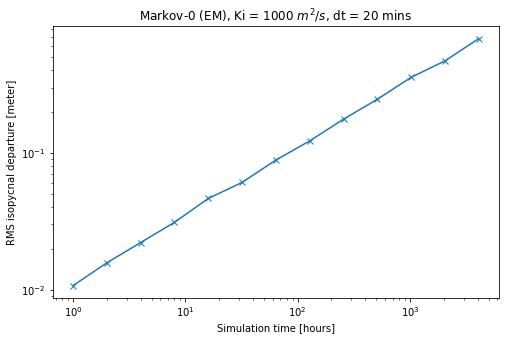

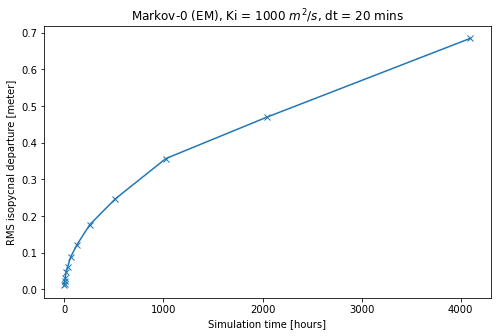

array([1.59320824e-08, 1.71493347e-08, 1.69621045e-08, 1.67636928e-08,
       1.86906890e-08, 1.60497415e-08, 1.70237705e-08, 1.62202305e-08,
       1.68591914e-08, 1.64568908e-08, 1.72420977e-08, 1.49728503e-08,
       1.58693126e-08])

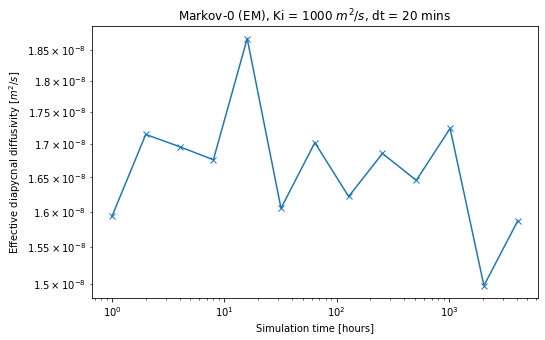

In [23]:
EM_error(20, 1000, powers=13)

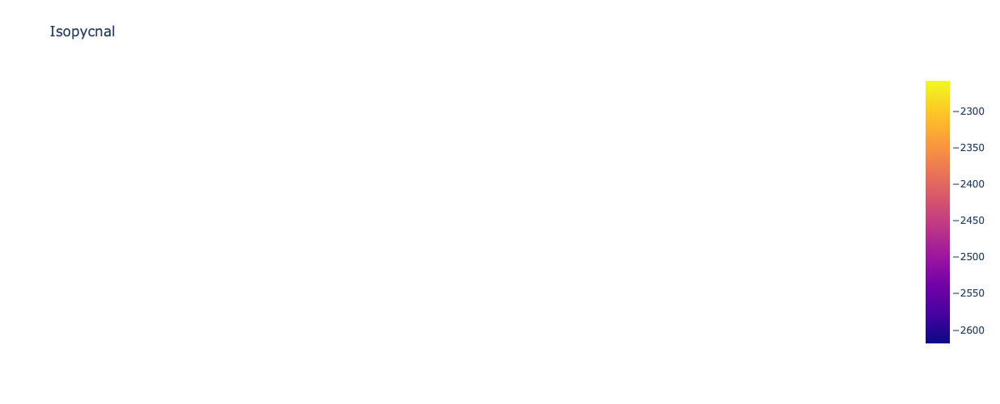

In [24]:
fig = go.Figure(data=[go.Surface(x=XX, y=YY, z=ZZ_iso1027, opacity=0.4),
                      go.Scatter3d(x=testParticles.lon, y=testParticles.lat, z=testParticles.depth,
                                   mode='markers', marker=dict(size=1, color='blue'), opacity=0.8)])
fig.update_layout(
    title="Isopycnal",
    autosize=False,
    width=800,
    height=500,
    margin=dict(l=65, r=50, b=65, t=90),
    scene=dict(
        aspectratio=dict(x=1, y=2, z=0.5),
        xaxis=dict(title="x [km]"),
        yaxis=dict(title="y [km]"),
        zaxis=dict(title="z [m]", nticks=3),
    ),
)

fig.show()

# Markov-1

In [37]:
# Create figure of initialized particles
testParticles = get_test_particles_dense(myField, fieldset, pclass=Markov1DebugParticle)
fig = go.Figure(data=[go.Surface(x=XX, y=YY, z=ZZ_iso1027, opacity=0.4, showscale=False),
                      go.Scatter3d(x=testParticles.lon, y=testParticles.lat, z=testParticles.depth,
                                   mode='markers', marker=dict(size=0.5, color='blue'), opacity=0.7)])
fig.update_layout(
    #title="Isopycnal",
    autosize=False,
    width=800,
    height=500,
    margin=dict(l=20, r=20, b=20, t=20),
    scene=dict(
        aspectratio=dict(x=1, y=2, z=0.5),
        xaxis=dict(title="x [m]"),
        yaxis=dict(title="y [m]"),
        zaxis=dict(title="z [m]", nticks=3),
    ),
    scene_camera = dict(
        eye=dict(x=1.25*1.8, y=-0.5*1.8, z=0.75*1.8)
    )
)
fig.write_image("viz/particles_dense_initialized.png", width=800, height=500, scale=3)

In [107]:
def surfaceIntegral(field, xlim, ylim):
    def f(y, x):
        return np.sqrt((field.g/field.Nsquared * field.alphax * field.kappax * np.cos(field.kappax * x))**2 +\
                       (field.g/field.Nsquared * field.alphay * field.kappay * np.cos(field.kappay * y))**2 +1)
    return dblquad(f, xlim[0], xlim[1], lambda x: ylim[0], lambda x: ylim[1])

In [108]:
def normalizedHistogram(testParticles, bins, field, rho_iso):
    areas = np.zeros(bins) 
    boundsx = np.linspace(0, 1_000_000, bins[0]+1)
    boundsy = np.linspace(0, 2_000_000, bins[1]+1)
    for i in range(bins[0]):
        for j in range(bins[1]):
            areas[i,j] = surfaceIntegral(field, (boundsx[i], boundsx[i+1]), (boundsy[j], boundsy[j+1]))[0]
    totalArea = np.sum(areas)
    areaWeights = areas/totalArea
    hist, xedges, yedges = np.histogram2d(testParticles.lon, testParticles.lat, bins=bins, range=[[0, 1000000], [0, 2000000]])
    normedHist = hist/areaWeights
    return normedHist, boundsx, boundsy, areas

In [21]:
fieldset = create_fieldset(myField, Ki=1000, Tl = 20 * 24 * 60 * 60, epsilon=40 * 60 / (20 * 24 * 60 * 60), eta=1e-10)
# For emulating a real field
fieldset.add_constant("Sc", 1)
fieldset.add_constant("Sd", 0.001)
fieldset.add_constant("upperBound", 1e5)
fieldset.add_constant("lowerBound", -1e5)
fieldset.add_constant("northBound", 1e7)
fieldset.add_constant("southBound", -1e7)
testParticles = get_test_particles_dense(myField, fieldset, pclass=Markov1DebugParticle)
testParticles.execute(
            testParticles.Kernel(elements_analytical.elements_analytical) 
            + testParticles.Kernel(Markov1_3D_BC_taper_init.Markov1_3D_BC_taper_init)
            + testParticles.Kernel(periodic_BC),
            dt=0,
            verbose_progress=True,
)
testParticles.execute(
    testParticles.Kernel(elements_analytical.elements_analytical) 
    + testParticles.Kernel(Markov1_3D_BC_taper.Markov1_3D_BC_taper) 
    + periodic_BC,
    runtime=timedelta(days=90),
    dt=timedelta(minutes=40),
    verbose_progress=True,
    #   output_file=output_file
#     recovery={parcels.ErrorCode.ErrorOutOfBounds: deleteParticle}
)
# output_file.close()
rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth)  # slope


INFO: Compiled Markov1DebugParticleelements_analyticalMarkov1_3D_BC_taper_initperiodic_BC ==> /tmp/parcels-23300/47c5b6ea453f359250474a900f78fee5_0.so
| |             #                                     | 0 Elapsed Time: 0:00:01
INFO: Compiled Markov1DebugParticleelements_analyticalMarkov1_3D_BC_taperperiodic_BC ==> /tmp/parcels-23300/92f5e582ee12e3ec847c6aaeab1c19cc_0.so
100% (7776000.0 of 7776000.0) |##########| Elapsed Time: 0:01:10 Time:  0:01:10


4.420101486635362

In [41]:
fieldset = create_fieldset(myField, Ki=1000, Tl = 20 * 24 * 60 * 60, epsilon=80 * 60 / (20 * 24 * 60 * 60), eta=1e-10)
# For emulating a real field
fieldset.add_constant("Sc", 1)
fieldset.add_constant("Sd", 0.001)
fieldset.add_constant("upperBound", 1e5)
fieldset.add_constant("lowerBound", -1e5)
fieldset.add_constant("northBound", 1e7)
fieldset.add_constant("southBound", -1e7)
testParticles = get_test_particles_dense(myField, fieldset, pclass=Markov1DebugParticle)
testParticles.execute(
            testParticles.Kernel(elements_analytical.elements_analytical) 
            + testParticles.Kernel(Markov1_3D_BC_taper_init.Markov1_3D_BC_taper_init)
            + testParticles.Kernel(periodic_BC),
            dt=0,
            verbose_progress=True,
)
testParticles.execute(
    testParticles.Kernel(elements_analytical.elements_analytical) 
    + testParticles.Kernel(Markov1_3D_BC_taper.Markov1_3D_BC_taper) 
    + periodic_BC,
    runtime=timedelta(days=90),
    dt=timedelta(minutes=20),
    verbose_progress=True,
    #   output_file=output_file
#     recovery={parcels.ErrorCode.ErrorOutOfBounds: deleteParticle}
)
# output_file.close()
rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth)  # slope



INFO: Compiled Markov1DebugParticleelements_analyticalMarkov1_3D_BC_taper_initperiodic_BC ==> /tmp/parcels-23300/f14712a0264701105a5421e707dca6a0_0.so
| |            #                                      | 0 Elapsed Time: 0:00:01
INFO: Compiled Markov1DebugParticleelements_analyticalMarkov1_3D_BC_taperperiodic_BC ==> /tmp/parcels-23300/70d1f71e58d71e35e41065b001afe4da_0.so
100% (7776000.0 of 7776000.0) |##########| Elapsed Time: 0:02:17 Time:  0:02:17


40.93939517992072

In [43]:
diapycnal_flux(90*24, 40.9)

0.00010756237139917695

In [44]:
# Create figure of initialized particles
fig = go.Figure(data=[go.Surface(x=XX, y=YY, z=ZZ_iso1027, opacity=0.4, showscale=False),
                      go.Scatter3d(x=testParticles.lon, y=testParticles.lat, z=testParticles.depth,
                                   mode='markers', marker=dict(size=0.5, color='blue'), opacity=0.7)])
fig.update_layout(
    #title="Isopycnal",
    autosize=False,
    width=800,
    height=500,
    margin=dict(l=20, r=20, b=20, t=20),
    scene=dict(
        aspectratio=dict(x=1, y=2, z=0.5),
        xaxis=dict(title="x [m]"),
        yaxis=dict(title="y [m]"),
        zaxis=dict(title="z [m]", nticks=3),
    ),
    scene_camera = dict(
        eye=dict(x=1.25*1.8, y=-0.5*1.8, z=0.75*1.8)
    )
)
fig.write_image("viz/particles_Markov1_90days_k1000_Tl20_dt40mins.png", width=800, height=500, scale=3)

In [24]:
def Markov1_error(kernel, dt_mins, Tl_days, Ki, powers=11, epsilon=0.01, eta=1e-5, returnWhat='diaflux', pclass=Markov1Particle):
    runHours = np.ones(powers) * 2**np.arange(powers)
    error = np.zeros(powers)
    if epsilon == 'dt-dependent':
        fieldset = create_fieldset(myField, Ki=Ki, Tl=Tl_days * 24 * 60 * 60, epsilon=dt_mins*60/(Tl_days*24*60*60), eta=eta)
    else:
        fieldset = create_fieldset(myField, Ki=Ki, Tl=Tl_days * 24 * 60 * 60, epsilon=epsilon, eta=eta)
    for i, hours in enumerate(runHours):
        testParticles = get_test_particles(myField, fieldset, pclass=pclass)
        testParticles.execute(
            testParticles.Kernel(kernel),
            runtime=timedelta(hours=hours),
            dt=timedelta(minutes=dt_mins),
            verbose_progress=True,
            recovery={parcels.ErrorCode.ErrorInterpolation: deleteParticle,
                      parcels.ErrorCode.ErrorOutOfBounds: deleteParticle}
        )
        error[i] = rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth)  # slope
    for i in range(2):
        fig, ax = plt.subplots(figsize=(8, 5))
        if i == 0:
            ax.loglog(runHours, error, '-x')
        else:
            ax.plot(runHours, error, '-x')
        ax.set_xlabel('Simulation time [hours]')
        ax.set_ylabel('RMS isopycnal departure [meter]')
        ax.set_title(fr"Markov-1, Tl = {Tl_days} days, Ki = {Ki} $m^2/s$, dt = {dt_mins} mins, eps = {epsilon:{'.2E' if isinstance(epsilon, float) else ''}}")
        plt.show()
    if returnWhat == 'diaflux':
        fig, ax = plt.subplots(figsize=(8, 5))
        ax.loglog(runHours, diapycnal_flux(runHours, error, mode="hours"), '-x')
        ax.set_ylabel(r"Effective diapycnal diffusivity [$m^2 s^{-1}$]")
        ax.set_xlabel('Simulation time [hours]')
        ax.set_title(fr"Markov-1, Tl = {Tl_days} days, Ki = {Ki} $m^2/s$, dt = {dt_mins} mins, eps = {epsilon:{'.2E' if isinstance(epsilon, float) else ''}}")
        return diapycnal_flux(runHours, error, mode="hours")
    elif returnWhat == 'error':
        return runHours, error

INFO: Compiled Markov1DebugParticleMarkov1_full ==> /tmp/parcels-23300/d37cfe37c228fc1f1a8e104e1b8466cf_0.so
100% (3600.0 of 3600.0) |################| Elapsed Time: 0:00:03 Time:  0:00:03
INFO: Compiled Markov1DebugParticleMarkov1_full ==> /tmp/parcels-23300/4ce7734ffb6761f8fb39768445d3172e_0.so
100% (7200.0 of 7200.0) |################| Elapsed Time: 0:00:03 Time:  0:00:03
INFO: Compiled Markov1DebugParticleMarkov1_full ==> /tmp/parcels-23300/6207bc41720c46da44503e1d7e1e3372_0.so
100% (14400.0 of 14400.0) |##############| Elapsed Time: 0:00:04 Time:  0:00:04
INFO: Compiled Markov1DebugParticleMarkov1_full ==> /tmp/parcels-23300/bd9e4bc9bf1a717ed45d95eb8a2fbd8c_0.so
100% (28800.0 of 28800.0) |##############| Elapsed Time: 0:00:04 Time:  0:00:04
INFO: Compiled Markov1DebugParticleMarkov1_full ==> /tmp/parcels-23300/8e7aa1386b29ee0a02ade9dffa74a135_0.so
100% (57600.0 of 57600.0) |##############| Elapsed Time: 0:00:03 Time:  0:00:03
INFO: Compiled Markov1DebugParticleMarkov1_full ==> /tm

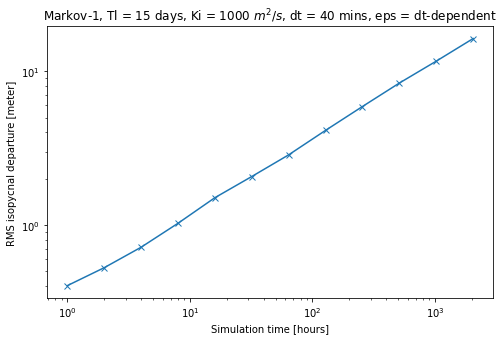

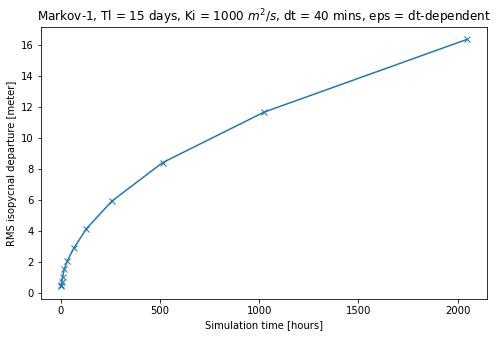

array([2.25335745e-05, 1.92947813e-05, 1.78143649e-05, 1.82546461e-05,
       1.96562111e-05, 1.85442414e-05, 1.77540532e-05, 1.84865541e-05,
       1.88931616e-05, 1.90748799e-05, 1.83883986e-05, 1.81010774e-05])

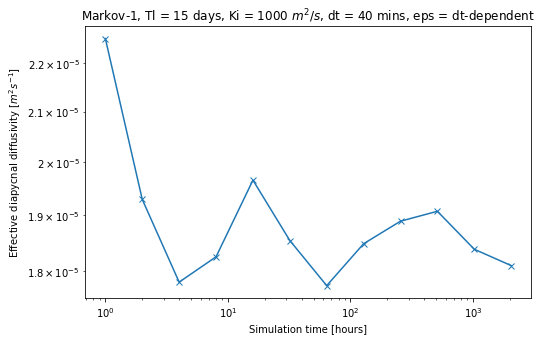

In [27]:
Markov1_error(Markov1_full, 40, 15, 1000, powers=12, epsilon='dt-dependent', pclass=Markov1DebugParticle)

## Check whether diffusion is as high as theoretically predicted....

In [37]:
def compute_asymptotic_diffusivity(ds, start=0, stop=-1):
    dims = ["x", "y", "z"]
    velos = ["u", "v", "w"]
    dimMap = dict(zip(dims, velos))
    
    T = int(ds.obs[stop]-ds.obs[start])
    
    K = dict()
    for dim1 in dims:
        for dim2 in dims:
            K[f"{dim1}{dim2}"] = np.cumsum(np.array([float(24*60*60*np.nanmean(ds[f"{dimMap[dim1]}_prime"].isel(obs=start)*ds[f"{dimMap[dim2]}_prime"].isel(obs=start+tau))) for tau in range(T)]))
                
    return K

## Compare diapycnal errors after 90 days

In [37]:
dt_mins = np.array([10, 20, 40, 80, 160, 360, 720])
runtypes = ["smallslope", "full_redi", "M1", "markov-1"]
diapycnal_errors = {}
for runtype in runtypes:
    diapycnal_errors[runtype] = {}

In [38]:
# full_redi
for dt in dt_mins:
    fieldset = create_fieldset(myField, K_method=None, expansion_terms=8, interp_method='linear', epsilon=0)
    fieldset.add_constant("upperBound", 1e5)
    fieldset.add_constant("lowerBound", -1e5)
    fieldset.add_constant("northBound", 1e7)
    fieldset.add_constant("southBound", -1e7)
    testParticles = get_test_particles(myField, fieldset, rho=1027.5)
    testParticles.execute(
                testParticles.Kernel(elements_analytical.elements_analytical) 
                + testParticles.Kernel(K_Redi.K_Redi) 
                + testParticles.Kernel(EM_3D_BC.EM_3D_BC),
                runtime=timedelta(hours=90),
                dt=timedelta(minutes=int(dt)),
                verbose_progress=True,
             #   output_file=output_file
    )
    #output_file.close()
    error = rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth) #slope
    dia_error = diapycnal_flux(90*24, error, mode="hours")
    diapycnal_errors["full_redi"][str(int(dt))] = dia_error

INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BC ==> /tmp/parcels-23300/ac21d5c065a9bf75cbaa78d17701a5bb_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:02 Time:  0:00:02
INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BC ==> /tmp/parcels-23300/7c148601092ff3e8bdf401c8d7f25bb1_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:03 Time:  0:00:03
INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BC ==> /tmp/parcels-23300/e1d2f793ae7cc9cd4533e447e3847f8d_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:03 Time:  0:00:03
INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BC ==> /tmp/parcels-23300/b5022ef796d1291e5cf1b44fa506ac3d_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:03 Time:  0:00:03
INFO: Compiled Markov1Particleelements_analyticalK_RediEM_3D_BC ==> /tmp/parcels-23300/b1553bd6334d9c8875d0914f86ff9b1d_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time

In [41]:
# smallslope
for dt in dt_mins:
    fieldset = create_fieldset(myField, K_method=None, expansion_terms=8, interp_method='linear', epsilon=0)
    fieldset.add_constant("Sc", 1)
    fieldset.add_constant("Sd", 0.001)
    fieldset.add_constant("upperBound", 1e5)
    fieldset.add_constant("lowerBound", -1e5)
    fieldset.add_constant("northBound", 1e7)
    fieldset.add_constant("southBound", -1e7)
    testParticles = get_test_particles(myField, fieldset, rho=1027.5)
    testParticles.execute(
                testParticles.Kernel(elements_analytical.elements_analytical) 
                + testParticles.Kernel(K_Redi_smallslope.K_Redi_smallslope) 
                + testParticles.Kernel(EM_3D_BC.EM_3D_BC),
                runtime=timedelta(hours=90),
                dt=timedelta(minutes=int(dt)),
                verbose_progress=True,
             #   output_file=output_file
    )
    #output_file.close()
    error = rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth) #slope
    dia_error = diapycnal_flux(90*24, error, mode="hours")
    diapycnal_errors["smallslope"][str(int(dt))] = dia_error

INFO: Compiled Markov1Particleelements_analyticalK_Redi_smallslopeEM_3D_BC ==> /tmp/parcels-23300/609df49af0bac844054df5f36b310225_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:05 Time:  0:00:05
INFO: Compiled Markov1Particleelements_analyticalK_Redi_smallslopeEM_3D_BC ==> /tmp/parcels-23300/f77317fc932c351114ee8eb2483e2f14_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:04 Time:  0:00:04
INFO: Compiled Markov1Particleelements_analyticalK_Redi_smallslopeEM_3D_BC ==> /tmp/parcels-23300/2ed8c2f92810cfb1798b2cdc00f864ac_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:04 Time:  0:00:04
INFO: Compiled Markov1Particleelements_analyticalK_Redi_smallslopeEM_3D_BC ==> /tmp/parcels-23300/6494aa22b5acb7f90d0065bbeddf87ff_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:04 Time:  0:00:04
INFO: Compiled Markov1Particleelements_analyticalK_Redi_smallslopeEM_3D_BC ==> /tmp/parcels-23300/7ed0893b8bac86733e766fbd3622863f_0.so


In [42]:
# M1
for dt in dt_mins:
    fieldset = create_fieldset(myField, Ki=1000, expansion_terms=8, interp_method='linear', epsilon=1e-13)
    fieldset.add_constant("Sc", 1)
    fieldset.add_constant("Sd", 0.001)
    fieldset.add_constant("upperBound", 1e5)
    fieldset.add_constant("lowerBound", -1e5)
    fieldset.add_constant("northBound", 1e7)
    fieldset.add_constant("southBound", -1e7)
    testParticles = get_test_particles(myField, fieldset, rho=1027.5)
    testParticles.execute(
                testParticles.Kernel(elements_analytical.elements_analytical) 
                + K_Redi.K_Redi
                + M1_3D_BC.M1_3D_BC,
                runtime=timedelta(hours=90),
                dt=timedelta(minutes=int(dt)),
                verbose_progress=True,
             #   output_file=output_file
    )
    #output_file.close()
    error = rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth) #slope
    dia_error = diapycnal_flux(90*24, error, mode="hours")
    diapycnal_errors["M1"][str(int(dt))] = dia_error

INFO: Compiled Markov1Particleelements_analyticalK_RediM1_3D_BC ==> /tmp/parcels-23300/16a7d3b566b511a8b6ce3af3f16772f4_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:06 Time:  0:00:06
INFO: Compiled Markov1Particleelements_analyticalK_RediM1_3D_BC ==> /tmp/parcels-23300/b8b1728485e1996da9b68f10276a097e_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:05 Time:  0:00:05
INFO: Compiled Markov1Particleelements_analyticalK_RediM1_3D_BC ==> /tmp/parcels-23300/bd6c34cac753755f4c18dda7520601d5_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:04 Time:  0:00:04
INFO: Compiled Markov1Particleelements_analyticalK_RediM1_3D_BC ==> /tmp/parcels-23300/ff935d56fb0d3e0d10a8a62746502776_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time: 0:00:04 Time:  0:00:04
INFO: Compiled Markov1Particleelements_analyticalK_RediM1_3D_BC ==> /tmp/parcels-23300/384b1536dd4ed83255fb72da6dac72ae_0.so
100% (324000.0 of 324000.0) |############| Elapsed Time

In [40]:
for dt in dt_mins:
    fieldset = create_fieldset(myField, Ki=1000, Tl = 20 * 24 * 60 * 60, epsilon=int(dt) * 60 / (20 * 24 * 60 * 60), eta=1e-10)
    # For emulating a real field
    fieldset.add_constant("Sc", 1)
    fieldset.add_constant("Sd", 0.001)
    fieldset.add_constant("upperBound", 1e5)
    fieldset.add_constant("lowerBound", -1e5)
    fieldset.add_constant("northBound", 1e7)
    fieldset.add_constant("southBound", -1e7)
    testParticles = get_test_particles(myField, fieldset, pclass=Markov1DebugParticle)
    testParticles.execute(
                testParticles.Kernel(elements_analytical.elements_analytical) 
                + testParticles.Kernel(Markov1_3D_BC_taper_init.Markov1_3D_BC_taper_init),
                dt=0,
                verbose_progress=True,
    )
    testParticles.execute(
        testParticles.Kernel(elements_analytical.elements_analytical) 
        + testParticles.Kernel(Markov1_3D_BC_taper.Markov1_3D_BC_taper),
        runtime=timedelta(days=90),
        dt=timedelta(minutes=int(dt)),
        verbose_progress=True,
        #   output_file=output_file
        recovery={parcels.ErrorCode.ErrorOutOfBounds: deleteParticle}
    )
    # output_file.close()
    rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth)  # slope

    error = rms_z_error(testParticles.lon, testParticles.lat, testParticles.depth) #slope
    dia_error = diapycnal_flux(90*24, error, mode="hours")
    diapycnal_errors["markov-1"][str(int(dt))] = dia_error

INFO: Compiled Markov1DebugParticleelements_analyticalMarkov1_3D_BC_taper_init ==> /tmp/parcels-23300/2d5fcace3b1d95b1e98ab8932cb1eaec_0.so
| |       #                                           | 0 Elapsed Time: 0:00:00
INFO: Compiled Markov1DebugParticleelements_analyticalMarkov1_3D_BC_taper ==> /tmp/parcels-23300/b90d7f2e33937541b94367dced7f4ee4_0.so
100% (7776000.0 of 7776000.0) |##########| Elapsed Time: 0:00:30 Time:  0:00:30
INFO: Compiled Markov1DebugParticleelements_analyticalMarkov1_3D_BC_taper_init ==> /tmp/parcels-23300/ddd058cac871f229c70109790733481a_0.so
| |            #                                      | 0 Elapsed Time: 0:00:01
INFO: Compiled Markov1DebugParticleelements_analyticalMarkov1_3D_BC_taper ==> /tmp/parcels-23300/0bf399b7152b3fdec430d99640224e43_0.so
100% (7776000.0 of 7776000.0) |##########| Elapsed Time: 0:00:17 Time:  0:00:17
INFO: Compiled Markov1DebugParticleelements_analyticalMarkov1_3D_BC_taper_init ==> /tmp/parcels-23300/929a7c04a74669340eacb48044db

In [43]:
# with open("diapycnal_errors_redi-markov.pickle", 'wb') as pickFile:
#     pickle.dump(diapycnal_errors, pickFile)
# diapycnal_errors

{'smallslope': {'10': 9.052990456986024e-08,
  '20': 1.320705366184419e-07,
  '40': 2.1611358712803084e-07,
  '80': 3.9669719064327957e-07,
  '160': 8.024832985927439e-07,
  '360': 1.6936180837821793e-06,
  '720': 3.432682798852617e-06},
 'full_redi': {'10': 4.9178837972790424e-08,
  '20': 8.432466439897994e-08,
  '40': 1.8750522191416551e-07,
  '80': 3.4939665438962026e-07,
  '160': 7.98165948845296e-07,
  '360': 1.861904922680398e-06,
  '720': 3.198273268603132e-06},
 'M1': {'10': 6.275061764608127e-12,
  '20': 1.0726462169679329e-11,
  '40': 3.411475053574593e-11,
  '80': 1.1917003111103702e-10,
  '160': 4.710203264511444e-10,
  '360': 2.2573641064269917e-09,
  '720': 7.608377392417623e-09},
 'markov-1': {'10': 2.4810894464755255e-10,
  '20': 9.154638671111733e-10,
  '40': 3.615237829385501e-09,
  '80': 1.4068155242760225e-08,
  '160': 4.610123629824144e-08,
  '360': 3.79740719790569e-08,
  '720': 6.557822714965625e-08}}

In [18]:
with open("diapycnal_errors_redi-markov.pickle", 'rb') as pickFile:
    diapycnal_errors = pickle.load(pickFile)

In [19]:
df = pd.DataFrame(diapycnal_errors)
df.rename(columns={
    'smallslope': 'Markov-0 (small-slope)',
    'full_redi': 'Markov-0 (full)',
    'M1' : 'Markov-0 (Milstein-1)',
    'markov-1' : 'Markov-1'
}, inplace=True)

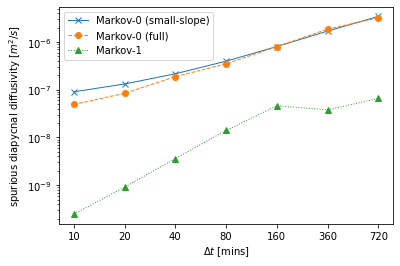

In [20]:
fig, ax = plt.subplots()
# df.plot(ax=ax, color='black')
ax.plot(df.index, df["Markov-0 (small-slope)"], color='C0', linewidth=1, linestyle='solid', marker='x', label="Markov-0 (small-slope)")
ax.plot(df.index, df["Markov-0 (full)"], color='C1', linewidth=1, linestyle='--', marker='o', label="Markov-0 (full)")
ax.plot(df.index, df["Markov-1"], color='C2', linewidth=1, linestyle=':', marker='^', label="Markov-1")



ax.set_yscale('log')
plt.legend()
ax.set_xlabel(r'$\Delta t$ [mins]')
ax.set_ylabel(r'spurious diapycnal diffusivity [$m^2/s$]')
plt.savefig("viz/idealized_error_90d.pdf", bbox_inches='tight')